In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Alternative: direct upload of zip file
import zipfile
import os

zip_path = "/content/fairytale_corpus.zip"
extract_dir = "/content/files_unzipped"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print("All files were unzipped to ", extract_dir, ".")

FileNotFoundError: [Errno 2] No such file or directory: '/content/fairytale_corpus.zip'

## Create Dataframe


In [ ]:
import os
import pandas as pd

# Base directory in Google Drive
base_path = "/content/drive/MyDrive/KI_Maerchen/Korpus"

rows = []

for root, dirs, files in os.walk(base_path):
    for file in files:
        if not file.endswith(".txt"):
            continue

        path = os.path.join(root, file)

        # Folder structure:
        # .../Korpus/Andersen/Original/FILE.txt
        parts = root.split(os.sep)

        # Author (Andersen / Grimm)
        author = parts[-2] if len(parts) >= 2 else "Unknown"

        # Type (Original / Copilot / Wikipedia)
        text_type = parts[-1] if len(parts) >= 1 else "Other"

        # Parse filename
        # Format: Year_OriginalAuthor_Source_Author_Title.txt
        name = file.replace(".txt", "")
        parts_file = name.split("_")

        year = parts_file[0] if parts_file[0].isdigit() else None
        original_author = parts_file[1] if len(parts_file) > 1 else None
        source = parts_file[2] if len(parts_file) > 2 else None
        author2 = parts_file[3] if len(parts_file) > 3 else None

        # Title = everything from index 4 onward
        title = " ".join(parts_file[4:]) if len(parts_file) > 4 else name

        # Load text
        with open(path, "r", encoding="utf-8") as f:
            text = f.read()

        rows.append({
            "Author": author,
            "Type": text_type,
            "Year": year,
            "OriginalAuthor": original_author,
            "Source": source,
            "Author2": author2,
            "Title": title,
            "Text": text,
            "Filename": file,
            "Path": path
        })

df = pd.DataFrame(rows)
df.to_csv("fairy_tale_corpus_complete.csv", index=False, encoding="utf-8-sig")
df.head()


,Author,Type,Year,OriginalAuthor,Source,Author2,Title,Text,Filename,Path
0,Andersen,Wikipedia,1987,Andersen,Wikipedia,Fleischer,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nIn einem kle...,1987_Andersen_Wikipedia_Fleischer_Der_kleine_u...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
1,Andersen,Wikipedia,1987,Andersen,Wikipedia,Burrell,Das Mädchen mit den Wunderhölzern,Das Mädchen mit den Wunderhölzern\n\nMolly möc...,1987_Andersen_Wikipedia_Burrell_Das_Mädchen_m...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
2,Andersen,Wikipedia,1986,Andersen,Wikipedia,Hartzell,Die Schneekönigin,"Die Schneekönigin\n\nEine Prophezeiung besagt,...",1986_Andersen_Wikipedia_Hartzell_Die_Schneekö...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
3,Andersen,Wikipedia,1968,Andersen,Wikipedia,Dunski,Ein uraltes Märchen,Ein uraltes Märchen\n\nEin armer Puppenspieler...,1968_Andersen_Wikipedia_Dunski_Ein_uraltes_Mä...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
4,Andersen,Wikipedia,1971,Andersen,Wikipedia,Küchenmeister,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nDer kleine K...,1971_Andersen_Wikipedia_Küchenmeister_Der_kle...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...


In [ ]:
df_grimm = df[df["OriginalAuthor"] == "Grimm"]
df_andersen = df[df["OriginalAuthor"] == "Andersen"]

df_grimm.to_csv("fairytale_corpus_grimm.csv", index=False, encoding="utf-8-sig")
df_andersen.to_csv("fairytale_corpus_andersen.csv", index=False, encoding="utf-8-sig")

In [ ]:
df_grimm.head()


,Author,Type,Year,OriginalAuthor,Source,Author2,Title,Text,Filename,Path
95,Grimm,Wikipedia,2014,Grimm,Wikipedia,Turhan,Die drei Federn,"Die drei Federn\n\nFürst Gundolf, des Regieren...",2014_Grimm_Wikipedia_Turhan_Die_drei_Federn.txt,/content/drive/MyDrive/KI_Maerchen/Korpus/Grim...
96,Grimm,Wikipedia,2025,Grimm,Wikipedia,Wilson,Schneewittchen,Schneewittchen\n\nIn einem friedlichen Königre...,2025_Grimm_Wikipedia_Wilson_Schneewittchen.txt,/content/drive/MyDrive/KI_Maerchen/Korpus/Grim...
97,Grimm,Wikipedia,2015,Grimm,Wikipedia,Bongartz,Hans im Glück,Hans im Glück\n\nNach sieben Jahren Lehre bei ...,2015_Grimm_Wikipedia_Bongartz_Hans_im_Glück.txt,/content/drive/MyDrive/KI_Maerchen/Korpus/Grim...
98,Grimm,Wikipedia,1962,Grimm,Wikipedia,Stobrawa,König Drosselbart,"König Drosselbart\n\nEine hübsche, etwas hochm...",1962_Grimm_Wikipedia_Stobrawa_König_Drosselba...,/content/drive/MyDrive/KI_Maerchen/Korpus/Grim...
99,Grimm,Wikipedia,1980,Grimm,Wikipedia,Hübner,Gevatter Tod,Gevatter Tod\n\nGörlitz um 1500: Der arme Baue...,1980_Grimm_Wikipedia_Hübner_Gevatter_Tod.txt,/content/drive/MyDrive/KI_Maerchen/Korpus/Grim...


In [ ]:
df_andersen.head()


,Author,Type,Year,OriginalAuthor,Source,Author2,Title,Text,Filename,Path
0,Andersen,Wikipedia,1987,Andersen,Wikipedia,Fleischer,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nIn einem kle...,1987_Andersen_Wikipedia_Fleischer_Der_kleine_u...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
1,Andersen,Wikipedia,1987,Andersen,Wikipedia,Burrell,Das Mädchen mit den Wunderhölzern,Das Mädchen mit den Wunderhölzern\n\nMolly möc...,1987_Andersen_Wikipedia_Burrell_Das_Mädchen_m...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
2,Andersen,Wikipedia,1986,Andersen,Wikipedia,Hartzell,Die Schneekönigin,"Die Schneekönigin\n\nEine Prophezeiung besagt,...",1986_Andersen_Wikipedia_Hartzell_Die_Schneekö...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
3,Andersen,Wikipedia,1968,Andersen,Wikipedia,Dunski,Ein uraltes Märchen,Ein uraltes Märchen\n\nEin armer Puppenspieler...,1968_Andersen_Wikipedia_Dunski_Ein_uraltes_Mä...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
4,Andersen,Wikipedia,1971,Andersen,Wikipedia,Küchenmeister,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nDer kleine K...,1971_Andersen_Wikipedia_Küchenmeister_Der_kle...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...


In [ ]:
df

,Author,Type,Year,OriginalAuthor,Source,Author2,Title,Text,Filename,Path
0,Andersen,Wikipedia,1987,Andersen,Wikipedia,Fleischer,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nIn einem kle...,1987_Andersen_Wikipedia_Fleischer_Der_kleine_u...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
1,Andersen,Wikipedia,1987,Andersen,Wikipedia,Burrell,Das Mädchen mit den Wunderhölzern,Das Mädchen mit den Wunderhölzern\n\nMolly möc...,1987_Andersen_Wikipedia_Burrell_Das_Mädchen_m...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
2,Andersen,Wikipedia,1986,Andersen,Wikipedia,Hartzell,Die Schneekönigin,"Die Schneekönigin\n\nEine Prophezeiung besagt,...",1986_Andersen_Wikipedia_Hartzell_Die_Schneekö...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
3,Andersen,Wikipedia,1968,Andersen,Wikipedia,Dunski,Ein uraltes Märchen,Ein uraltes Märchen\n\nEin armer Puppenspieler...,1968_Andersen_Wikipedia_Dunski_Ein_uraltes_Mä...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
4,Andersen,Wikipedia,1971,Andersen,Wikipedia,Küchenmeister,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nDer kleine K...,1971_Andersen_Wikipedia_Küchenmeister_Der_kle...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
...,...,...,...,...,...,...,...,...,...,...
304,Grimm,Copilot,2011,Grimm,Copilot,Kreis,Die zertanzten Schuhe,Die zertanzten Schuhe \n\nEs war einmal ein Kö...,2011_Grimm_Copilot_Kreis_Die_zertanzten_Schuhe...,/content/drive/MyDrive/KI_Maerchen/Korpus/Grim...
305,Grimm,Copilot,2013,Grimm,Copilot,Wirkola,Hänsel und Gretel Hexenjäger,Hänsel und Gretel\n\nEs war einmal ein Bruder ...,2013_Grimm_Copilot_Wirkola_Hänsel_und_Gretel_...,/content/drive/MyDrive/KI_Maerchen/Korpus/Grim...
306,Grimm,Copilot,1982,Grimm,Copilot,Hofman,Der dritte Prinz,Der dritte Prinz\n\nIn einem fernen Königreich...,1982_Grimm_Copilot_Hofman_Der_dritte_Prinz.txt,/content/drive/MyDrive/KI_Maerchen/Korpus/Grim...
307,Grimm,Copilot,2011,Grimm,Copilot,Johnson,Red Riding Hood,Red Riding Hood \n\nEs war einmal ein abgelege...,2011_Grimm_Copilot_Johnson_Red_Riding_Hood.txt,/content/drive/MyDrive/KI_Maerchen/Korpus/Grim...


In [ ]:
#df = pd.read_csv("fairytale_corpus_andersen.csv", sep=",")
#print(df.columns)
#df.head()

Index(['Author', 'Type', 'Year', 'OriginalAuthor', 'Source', 'Author2',
       'Title', 'Text', 'Filename', 'Path'],
      dtype='object')


,Author,Type,Year,OriginalAuthor,Source,Author2,Title,Text,Filename,Path
0,Andersen,Wikipedia,1987,Andersen,Wikipedia,Fleischer,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nIn einem kle...,1987_Andersen_Wikipedia_Fleischer_Der_kleine_u...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
1,Andersen,Wikipedia,1987,Andersen,Wikipedia,Burrell,Das Mädchen mit den Wunderhölzern,Das Mädchen mit den Wunderhölzern\n\nMolly möc...,1987_Andersen_Wikipedia_Burrell_Das_Mädchen_m...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
2,Andersen,Wikipedia,1986,Andersen,Wikipedia,Hartzell,Die Schneekönigin,"Die Schneekönigin\n\nEine Prophezeiung besagt,...",1986_Andersen_Wikipedia_Hartzell_Die_Schneekö...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
3,Andersen,Wikipedia,1968,Andersen,Wikipedia,Dunski,Ein uraltes Märchen,Ein uraltes Märchen\n\nEin armer Puppenspieler...,1968_Andersen_Wikipedia_Dunski_Ein_uraltes_Mä...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...
4,Andersen,Wikipedia,1971,Andersen,Wikipedia,Küchenmeister,Der kleine und der große Klaus,Der kleine und der große Klaus\n\nDer kleine K...,1971_Andersen_Wikipedia_Küchenmeister_Der_kle...,/content/drive/MyDrive/KI_Maerchen/Korpus/Ande...


In [ ]:
!pip install bertopic sentence-transformers scikit-learn pandas


In [ ]:
import re
import pandas as pd
from pathlib import Path

from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction import text


### Topic Modeling Grimm + Andersen

In [ ]:
def clean_text(text: str) -> str:
    # Remove non-breaking spaces and line breaks
    text = text.replace("\xa0", " ").replace("\n", " ")

    # Lowercase
    text = text.lower()

    # Remove text in brackets (e.g. "(1989 film)")
    text = re.sub(r"\([^)]*\)", "", text)

    # Keep letters only (English + German)
    #text = re.sub(r"[^a-zäöüß\s]", " ", text)

    # Remove extra spaces
    text = re.sub(r"\s+", " ", text).strip()

    return text


In [ ]:
def split_into_chunks(text, chunk_size=100): # chunk_size=200
    words = text.split()
    return [
        " ".join(words[i:i + chunk_size])
        for i in range(0, len(words), chunk_size)
    ]


In [ ]:
documents = []
sources = []

for index, row in df.iterrows():
    name = row["Title"]
    raw_text = row["Text"]
    cleaned = clean_text(raw_text)
    chunks = split_into_chunks(cleaned, chunk_size=200)

    documents.extend(chunks)
    sources.extend([name] * len(chunks))

### Stop word removal with Spacy

In [ ]:
!python -m spacy download de_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 69.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('de_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
# Import Package
import spacy
# Load pipeline Pipeline
nlp = spacy.load("de_core_news_sm")
#nlp_english = spacy.load("en_core_web_sm")
stopwords_german = nlp.Defaults.stop_words
#stopwords_english = nlp_english.Defaults.stop_words
print(stopwords_german)
#print(stopwords_english)


{'meine', 'vierten', 'unserer', 'jetzt', 'wurden', 'derjenige', 'ganz', 'geworden', 'mehr', 'na', 'bekannt', 'diejenige', 'muß', 'waren', 'sechste', 'ihn', 'über', 'besonders', 'eben', 'möchte', 'sei', 'großen', 'dank', 'fünfter', 'ab', 'könnt', 'kleine', 'kleiner', 'bist', 'neuntes', 'sie', 'solche', 'jenem', 'vierte', 'unter', 'bald', 'meines', 'seit', 'lange', 'eigen', 'willst', 'dermaßen', 'großes', 'einander', 'manchen', 'musste', 'ins', 'gehabt', 'vergangenen', 'welches', 'wir', 'grossen', 'demgemäss', 'derjenigen', 'mochte', 'werden', 'jahre', 'sagt', 'bei', 'kein', 'gutes', 'dieselbe', 'keiner', 'sechstes', 'uns', 'siebentes', 'fünf', 'wenig', 'was', 'demzufolge', 'heute', 'grosser', 'dass', 'gross', 'sieben', 'wäre', 'überhaupt', 'gekannt', 'leicht', 'mögt', 'tel', 'wenigstens', 'zehnten', 'jedoch', 'hat', 'wart', 'jemandem', 'satt', 'zeit', 'auf', 'ohne', 'also', 'durfte', 'hier', 'weiter', 'wird', 'selbst', 'ob', 'neuen', 'sind', 'beim', 'wessen', 'drei', 'sollten', 'es', 'n

In [ ]:
vectorizer_model = CountVectorizer(
    stop_words=list(stopwords_german),
    ngram_range=(1, 2),
    min_df=3
)

### Perform topic modeling

In [ ]:
# Create embedding model
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [ ]:
#Initialize and run BERTopic
topic_model = BERTopic(
    nr_topics=20,
    embedding_model=embedding_model,
    vectorizer_model=vectorizer_model,
    language="german", #multilingual
    min_topic_size=3, #min_topic_size=10, (to increase clusters)
    verbose=True
)

topics, probs = topic_model.fit_transform(documents)

2026-02-09 18:57:27,084 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/49 [00:00<?, ?it/s]

2026-02-09 18:57:31,678 - BERTopic - Embedding - Completed ✓
2026-02-09 18:57:31,679 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-02-09 18:57:36,608 - BERTopic - Dimensionality - Completed ✓
2026-02-09 18:57:36,609 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-02-09 18:57:36,687 - BERTopic - Cluster - Completed ✓
2026-02-09 18:57:36,688 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-02-09 18:57:37,089 - BERTopic - Representation - Completed ✓
2026-02-09 18:57:37,090 - BERTopic - Topic reduction - Reducing number of topics
2026-02-09 18:57:37,101 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-02-09 18:57:37,477 - BERTopic - Representation - Completed ✓
2026-02-09 18:57:37,480 - BERTopic - Topic reduction - Reduced number of topics from 126 to 20


In [ ]:
# Inspect topics
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,436,-1_könig_sprach_prinzessin_gerda,"[könig, sprach, prinzessin, gerda, prinz, vate...",[ihm die seele der welt zu sehen. auf seiner m...
1,0,861,0_könig_prinzessin_sprach_frau,"[könig, prinzessin, sprach, frau, wald, königi...",[die prinzessin auf der erbse regen fiel in st...
2,1,56,1_marie_elsa_anna_stiefmutter,"[marie, elsa, anna, stiefmutter, ball, schuh, ...","[frozen – die eiskönigin, völlig unverfroren e..."
3,2,47,2_hans_elisa_goldklumpen_schwäne,"[hans, elisa, goldklumpen, schwäne, brüder, jo...","[die elf schwäne es war einmal ein könig, der ..."
4,3,43,3_freude_leben_mut_barbara,"[freude, leben, mut, barbara, reich, tanzen, w...","[als hätte sie nur geträumt, dass die welt ohn..."
5,4,26,4_hänsel_hexe_hexen_kinder,"[hänsel, hexe, hexen, kinder, wald, vater, gre...",[dass mina ihn geheilt hat. es stellt sich her...
6,5,16,5_aurora_maleficent_feen_ingrith,"[aurora, maleficent, feen, ingrith, moore, fee...",[maleficent: mächte der finsternis in den fünf...
7,6,15,6_graf_meisterdieb_robert_grafen,"[graf, meisterdieb, robert, grafen, ring, gräf...","[anerkennung geben, ansonsten stirbt er. mit l..."
8,7,9,7_karte_großmutter_schatz_maria,"[karte, großmutter, schatz, maria, schiff, gro...",[pepolino und der schatz der meerjungfrau seit...
9,8,7,8_stimme_oberfläche_menschen_meerjungfrau,"[stimme, oberfläche, menschen, meerjungfrau, m...","[arielle arielle , die jüngste tochter von kön..."


In [ ]:
topic_info_df = topic_model.get_topic_info()
topic_info_df.to_csv('topic_info.csv', index=False)
print("Topic information saved to topic_info.csv")

Topic information saved to topic_info.csv


In [ ]:
topic_model.get_topic(0)

[('könig', np.float64(0.023867094812704073)),
 ('prinzessin', np.float64(0.01830593331049619)),
 ('sprach', np.float64(0.017962582218843514)),
 ('frau', np.float64(0.013852335695826994)),
 ('wald', np.float64(0.013474848956439241)),
 ('königin', np.float64(0.013070394561184785)),
 ('mädchen', np.float64(0.012993224536080138)),
 ('schloss', np.float64(0.012676431613237655)),
 ('klaus', np.float64(0.012312199295727614)),
 ('mann', np.float64(0.012174049381050179))]

### Create Wordclouds of topics

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

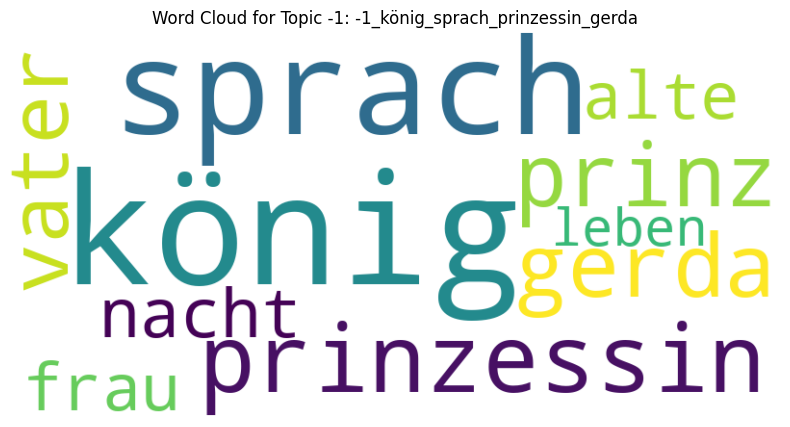

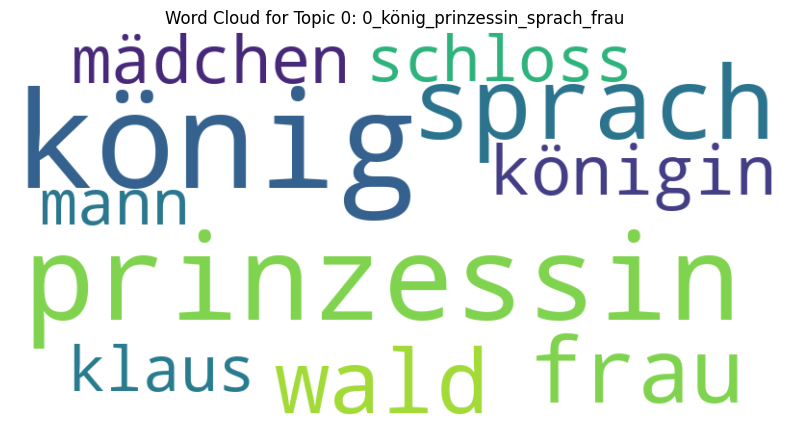

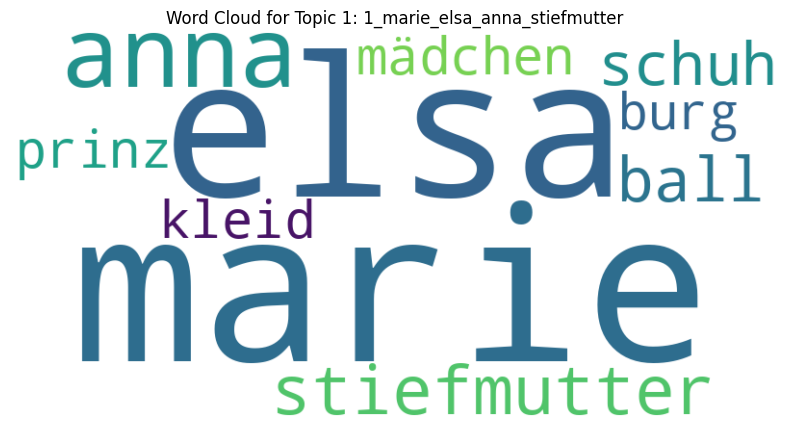

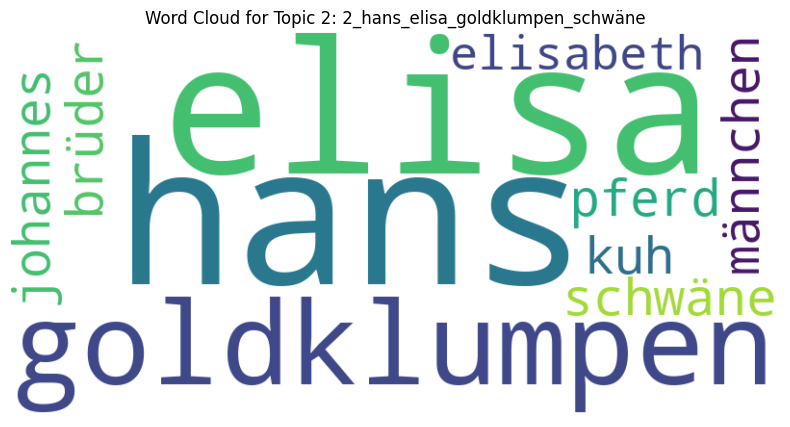

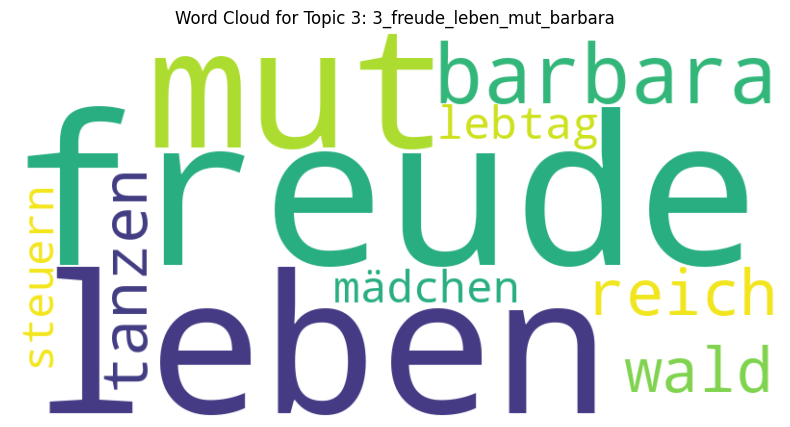

...

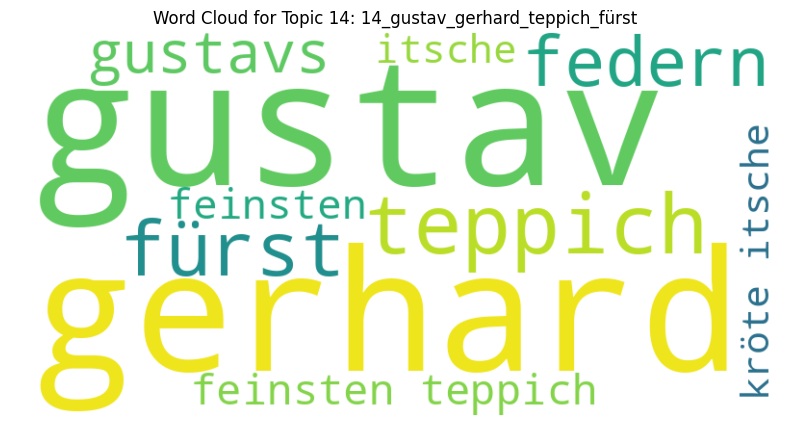

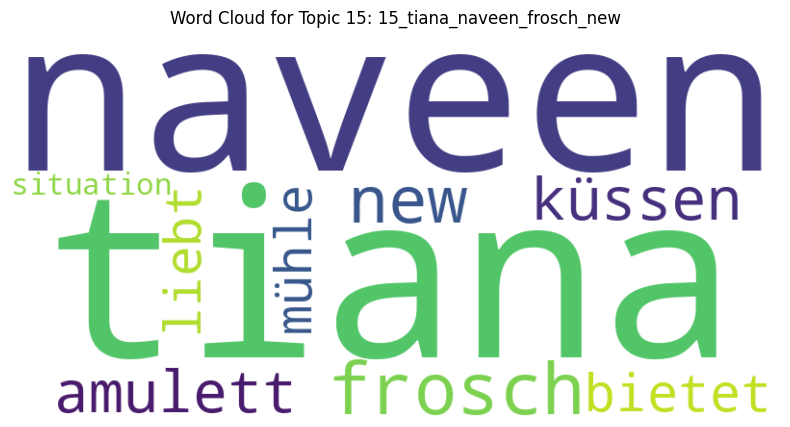

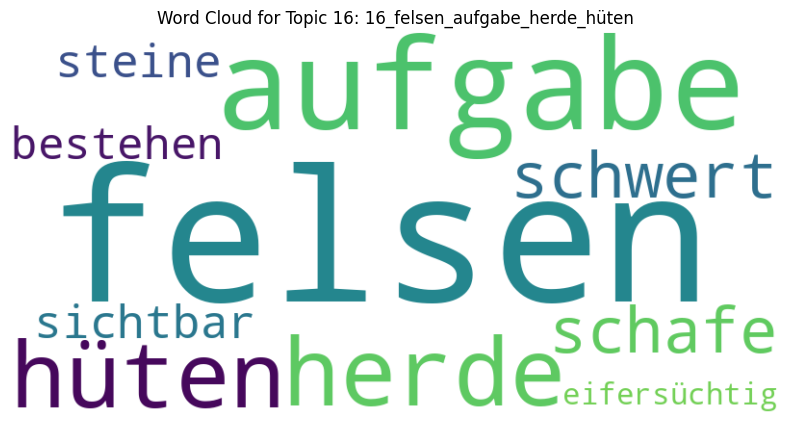

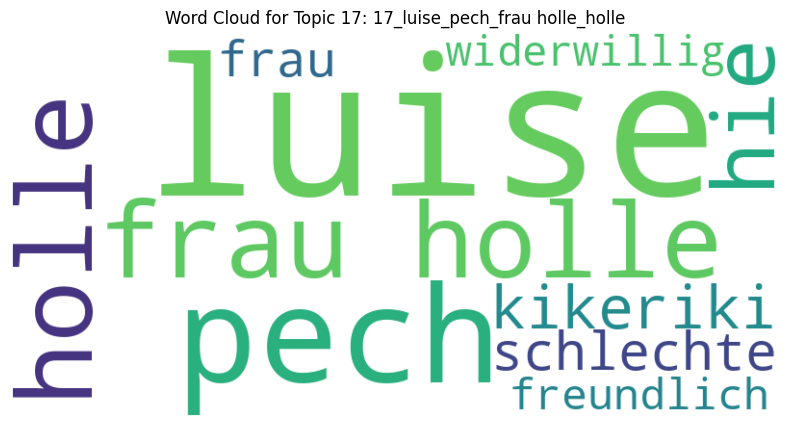

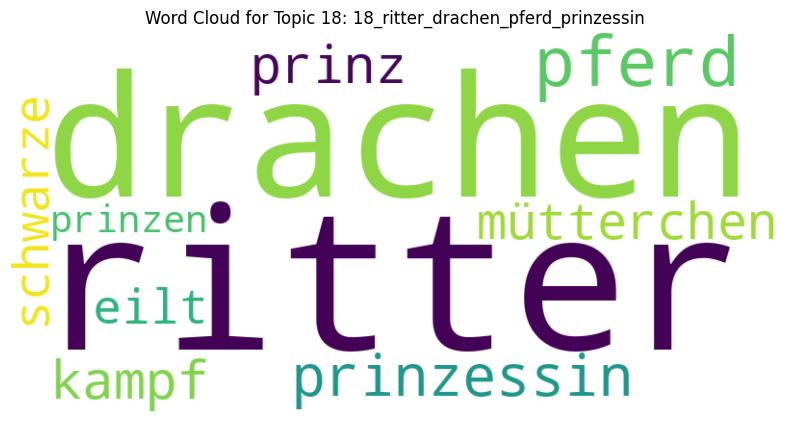

In [ ]:
# Get all topic information
all_topics_info = topic_model.get_topic_info()

# Filter out topic -1 (outliers) if you don't want a word cloud for it
# You can modify this loop to exclude any specific topics or include only a subset
for index, row in all_topics_info.iterrows():
    topic_id = row['Topic']
    topic_name = row['Name']

    # Get the words and their probabilities for the current topic
    topic_words_scores = topic_model.get_topic(topic_id)

    # Extract words and scores
    word_scores = {word: score for word, score in topic_words_scores}

    # Create the WordCloud object
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_scores)

    # Display the generated image:
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Topic {topic_id}: {topic_name}')
    plt.show()

In [ ]:
# Create results dataframe
# To fix the ValueError, we reconstruct the metadata lists (author, type, year)
# by repeating the values for each chunk generated from the original stories.

authors, types, years = [], [], []

for _, row in df.iterrows():
    # Re-calculate how many chunks this specific row produced
    # using the same logic from your 'split_into_chunks' step
    cleaned = clean_text(row["Text"])
    chunks_count = len(split_into_chunks(cleaned, chunk_size=200))

    # Repeat the metadata values for each of those chunks
    authors.extend([row["Author"]] * chunks_count)
    types.extend([row["Type"]] * chunks_count)
    years.extend([row["Year"]] * chunks_count)

# Now all lists have the same length and can be combined into a DataFrame
df_topic_modeling = pd.DataFrame({
    "text": documents,
    "topic": topics,
    "source": sources,
    "author": authors,
    "type": types,
    "year": years
})

df_topic_modeling.head()

,text,topic,source,author,type,year
0,der kleine und der große klaus in einem kleine...,0,Der kleine und der große Klaus,Andersen,Wikipedia,1987
1,"hause, denn es ist spät geworden. als er an ei...",-1,Der kleine und der große Klaus,Andersen,Wikipedia,1987
2,noch leckeren rotwein hinter dem kamin hätte. ...,0,Der kleine und der große Klaus,Andersen,Wikipedia,1987
3,unter dem schutt zu finden. mittellos kehrt er...,0,Der kleine und der große Klaus,Andersen,Wikipedia,1987
4,das mädchen mit den wunderhölzern molly möchte...,-1,Das Mädchen mit den Wunderhölzern,Andersen,Wikipedia,1987


In [ ]:
df_topic_modeling.to_csv('df_topic_modeling', index=False)
print("Topic information saved to df_topic_modeling")

Topic information saved to df_topic_modeling


### Topic Modeling Andersen

In [ ]:
def clean_text(text: str) -> str:
    # Remove non-breaking spaces and line breaks
    text = text.replace("\xa0", " ").replace("\n", " ")

    # Lowercase
    text = text.lower()

    # Remove text in brackets (e.g. "(1989 film)")
    text = re.sub(r"\([^)]*\)", "", text)

    # Keep letters only (English + German)
    #text = re.sub(r"[^a-zäöüß\s]", " ", text)

    # Remove extra spaces
    text = re.sub(r"\s+", " ", text).strip()

    return text


In [ ]:
def split_into_chunks(text, chunk_size=100): # chunk_size=200
    words = text.split()
    return [
        " ".join(words[i:i + chunk_size])
        for i in range(0, len(words), chunk_size)
    ]


In [ ]:
documents = []
sources = []

for index, row in df_andersen.iterrows():
    name = row["Title"]
    raw_text = row["Text"]
    cleaned = clean_text(raw_text)
    chunks = split_into_chunks(cleaned, chunk_size=200)

    documents.extend(chunks)
    sources.extend([name] * len(chunks))

### Stop word removal with Spacy

In [ ]:
vectorizer_model = CountVectorizer(
    stop_words=list(stopwords_german),
    ngram_range=(1, 2),
    min_df=3
)

### Perform topic modeling

In [ ]:
# Create embedding model
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [ ]:
#Initialize and run BERTopic
topic_model_andersen = BERTopic(
    nr_topics=20,
    embedding_model=embedding_model,
    vectorizer_model=vectorizer_model,
    language="german", #multilingual
    min_topic_size=3, #min_topic_size=10, (to increase clusters)
    verbose=True
)

# Corrected: Fit the 'topic_model_andersen' variable
topics, probs = topic_model_andersen.fit_transform(documents)

2026-02-09 19:07:32,160 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/19 [00:00<?, ?it/s]

2026-02-09 19:07:33,993 - BERTopic - Embedding - Completed ✓
2026-02-09 19:07:33,995 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-02-09 19:07:35,200 - BERTopic - Dimensionality - Completed ✓
2026-02-09 19:07:35,201 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-02-09 19:07:35,231 - BERTopic - Cluster - Completed ✓
2026-02-09 19:07:35,232 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-02-09 19:07:35,383 - BERTopic - Representation - Completed ✓
2026-02-09 19:07:35,384 - BERTopic - Topic reduction - Reducing number of topics
2026-02-09 19:07:35,391 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-02-09 19:07:35,531 - BERTopic - Representation - Completed ✓
2026-02-09 19:07:35,533 - BERTopic - Topic reduction - Reduced number of topics from 52 to 20


In [ ]:
# Inspect topics
topic_model_andersen.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,153,-1_sehen_gerda_wasser_frau,"[sehen, gerda, wasser, frau, prinzessin, johan...",[zu gelangen. der reisekamerad dagegen flog zu...
1,0,220,0_klaus_gerda_kay_wasser,"[klaus, gerda, kay, wasser, jan, alte, sack, s...","[aber allen denen, die ihn fragten, was die hä..."
2,1,66,1_prinzessin_kaiser_prinz_kleider,"[prinzessin, kaiser, prinz, kleider, schweineh...",[die prinzessin auf der erbse prinz fridolin a...
3,2,23,2_däumelinchen_mädchen_maikäfer_schwalbe,"[däumelinchen, mädchen, maikäfer, schwalbe, fr...",[durch. das seerosenblatt löste sich und trieb...
4,3,20,3_galoschen_glücks_sorge_wächter,"[galoschen, glücks, sorge, wächter, körper, me...","[ein jeder, der sie anzieht, augenblicklich an..."
5,4,18,4_elisa_brüder_schwäne_könig,"[elisa, brüder, schwäne, könig, brüdern, tocht...",[die elf schwäne der könig feiert wie jedes ja...
6,5,15,5_soldat_feuerzeug_hexe_soldaten,"[soldat, feuerzeug, hexe, soldaten, baum, hund...",[das feuerzeug es kam ein soldat die landstraß...
7,6,14,6_hella_schuhe_streichholz_mädchen,"[hella, schuhe, streichholz, mädchen, engel, r...","[streichhölzer, kauft streichhölzer! die klein..."
8,7,12,7_elsa_hans_kräfte_schwester,"[elsa, hans, kräfte, schwester, angst, winter,...","[den fjord. hans sagt elsa, dass anna durch ih..."
9,8,9,8_karte_großmutter_maria_schiff,"[karte, großmutter, maria, schiff, emil, kerke...",[pepolino und der schwanz der meerjungfrau hex...


In [ ]:
topic_info_df_andersen = topic_model_andersen.get_topic_info()
topic_info_df_andersen.to_csv('topic_info_andersen.csv', index=False)
print("Topic information saved to topic_info_andersen.csv")

Topic information saved to topic_info_andersen.csv


In [ ]:
topic_model_andersen.get_topic(0)

[('klaus', np.float64(0.03661874984129521)),
 ('gerda', np.float64(0.02611498822423279)),
 ('kay', np.float64(0.016037636535472296)),
 ('wasser', np.float64(0.015339756868160245)),
 ('jan', np.float64(0.014409590294714503)),
 ('alte', np.float64(0.014253699928827825)),
 ('sack', np.float64(0.014103003267167387)),
 ('schneekönigin', np.float64(0.013795813960292565)),
 ('sonne', np.float64(0.012255674895734807)),
 ('herz', np.float64(0.011868653574896918))]

### Create Wordclouds of topics

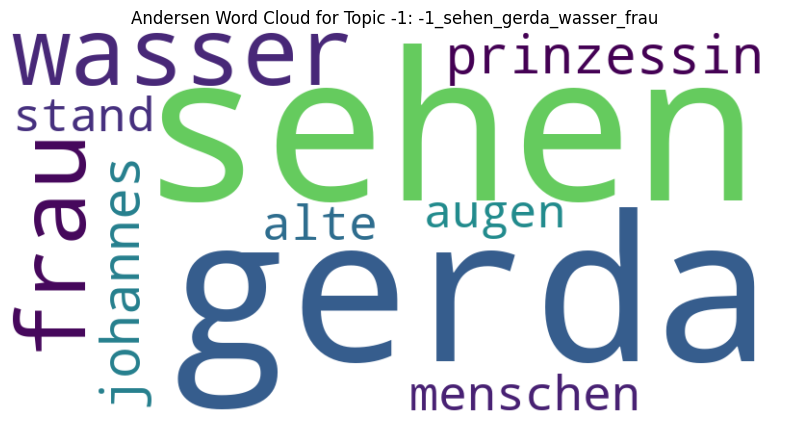

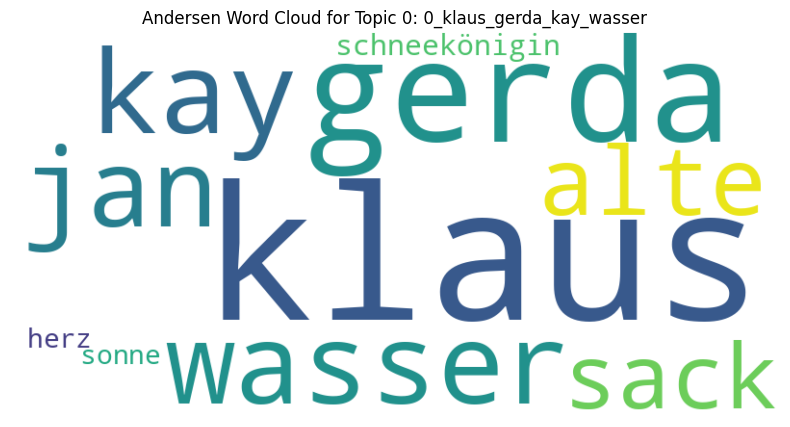

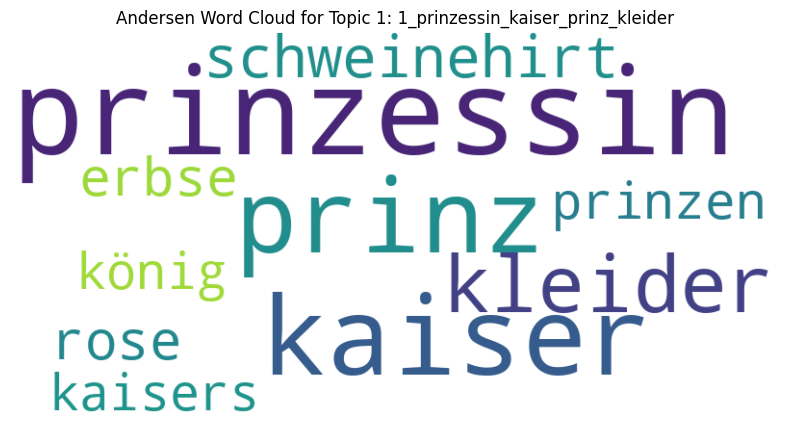

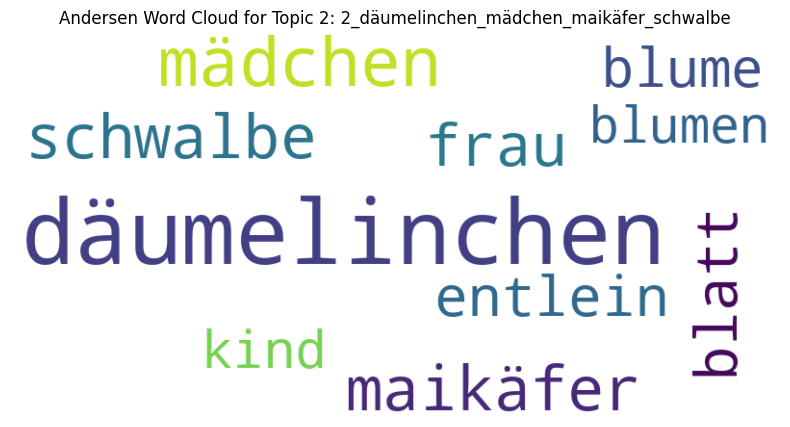

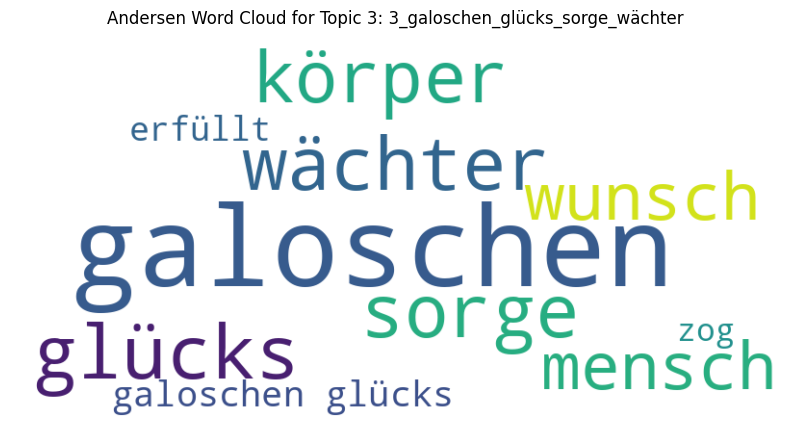

...

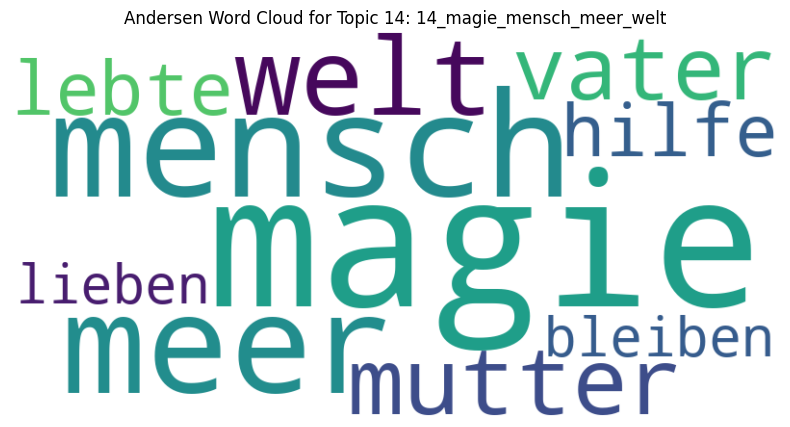

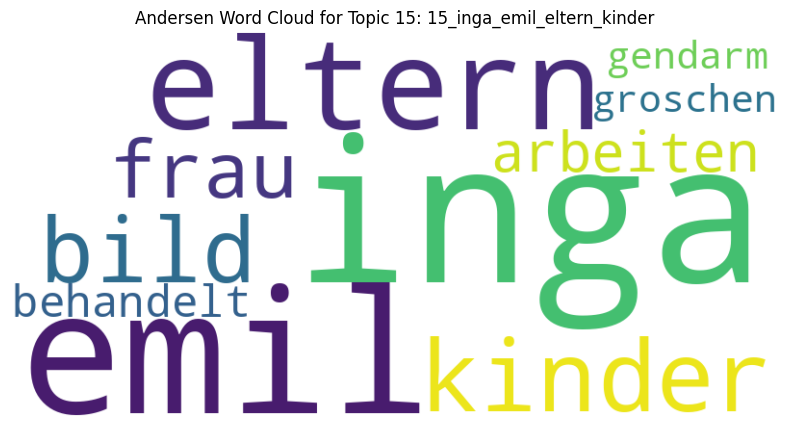

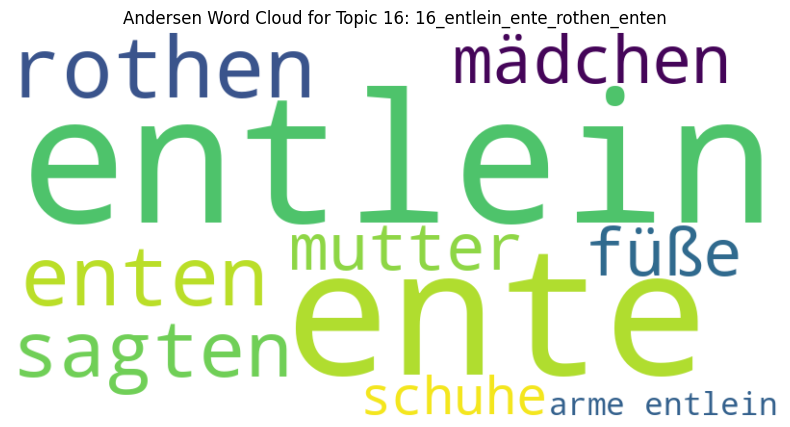

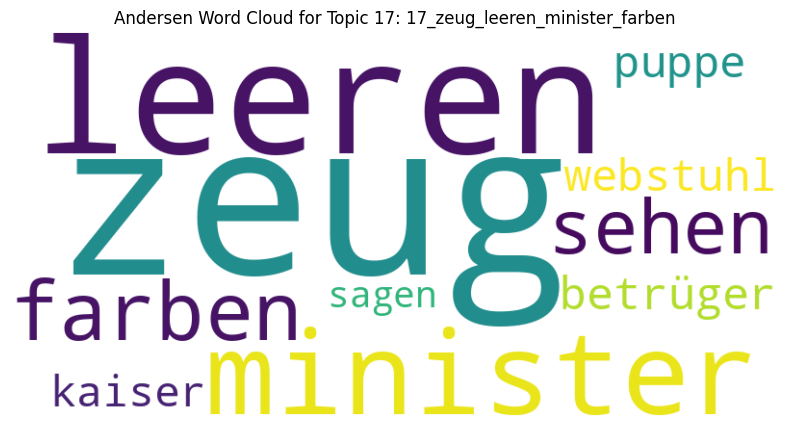

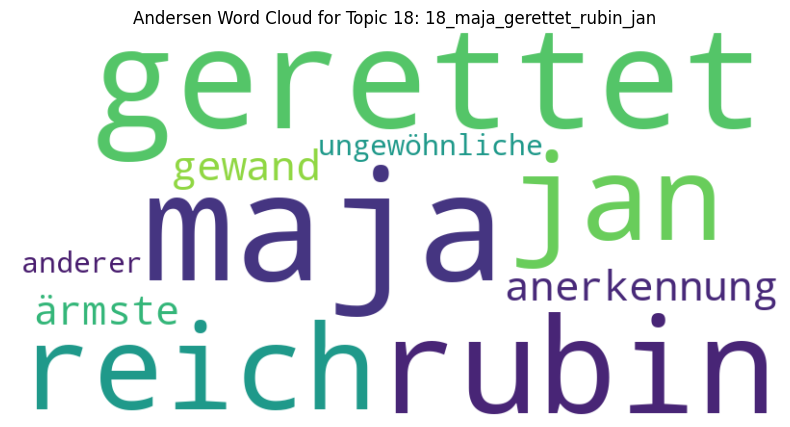

In [ ]:
# Get all topic information
all_topics_info_andersen = topic_model_andersen.get_topic_info()

# Filter out topic -1 (outliers) if you don't want a word cloud for it
# You can modify this loop to exclude any specific topics or include only a subset
for index, row in all_topics_info_andersen.iterrows():
    topic_id = row['Topic']
    topic_name = row['Name']

    # Get the words and their probabilities for the current topic
    topic_words_scores_andersen = topic_model_andersen.get_topic(topic_id)

    # Extract words and scores
    word_scores_andersen = {word: score for word, score in topic_words_scores_andersen}

    # Create the WordCloud object
    wordcloud_andersen = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_scores_andersen)

    # Display the generated image:
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_andersen, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Andersen Word Cloud for Topic {topic_id}: {topic_name}')
    plt.show()

In [ ]:
# Create results dataframe
# To fix the ValueError, we reconstruct the metadata lists (author, type, year)
# by repeating the values for each chunk generated from the original stories.

authors, types, years = [], [], []

for _, row in df_andersen.iterrows():
    # Re-calculate how many chunks this specific row produced
    # using the same logic from your 'split_into_chunks' step
    cleaned = clean_text(row["Text"])
    chunks_count = len(split_into_chunks(cleaned, chunk_size=200))

    # Repeat the metadata values for each of those chunks
    authors.extend([row["Author"]] * chunks_count)
    types.extend([row["Type"]] * chunks_count)
    years.extend([row["Year"]] * chunks_count)

# Now all lists have the same length and can be combined into a DataFrame
df_topic_modeling_andersen = pd.DataFrame({
    "text": documents,
    "topic": topics,
    "source": sources,
    "author": authors,
    "type": types,
    "year": years
})

df_topic_modeling_andersen.head()

,text,topic,source,author,type,year
0,der kleine und der große klaus in einem kleine...,0,Der kleine und der große Klaus,Andersen,Wikipedia,1987
1,"hause, denn es ist spät geworden. als er an ei...",0,Der kleine und der große Klaus,Andersen,Wikipedia,1987
2,noch leckeren rotwein hinter dem kamin hätte. ...,0,Der kleine und der große Klaus,Andersen,Wikipedia,1987
3,unter dem schutt zu finden. mittellos kehrt er...,0,Der kleine und der große Klaus,Andersen,Wikipedia,1987
4,das mädchen mit den wunderhölzern molly möchte...,-1,Das Mädchen mit den Wunderhölzern,Andersen,Wikipedia,1987


In [ ]:
df_topic_modeling_andersen.to_csv('df_topic_modelin_andersen', index=False)
print("Topic information saved to df_topic_modeling_andersen")

Topic information saved to df_topic_modeling_andersen


### Topic Modeling Grimm

In [ ]:
def clean_text(text: str) -> str:
    # Remove non-breaking spaces and line breaks
    text = text.replace("\xa0", " ").replace("\n", " ")

    # Lowercase
    text = text.lower()

    # Remove text in brackets (e.g. "(1989 film)")
    text = re.sub(r"\([^)]*\)", "", text)

    # Keep letters only (English + German)
    #text = re.sub(r"[^a-zäöüß\s]", " ", text)

    # Remove extra spaces
    text = re.sub(r"\s+", " ", text).strip()

    return text


In [ ]:
def split_into_chunks(text, chunk_size=100): # chunk_size=200
    words = text.split()
    return [
        " ".join(words[i:i + chunk_size])
        for i in range(0, len(words), chunk_size)
    ]


In [ ]:
documents = []
sources = []

for index, row in df_grimm.iterrows():
    name = row["Title"]
    raw_text = row["Text"]
    cleaned = clean_text(raw_text)
    chunks = split_into_chunks(cleaned, chunk_size=200)

    documents.extend(chunks)
    sources.extend([name] * len(chunks))

### Stop word removal with Spacy

In [ ]:
vectorizer_model = CountVectorizer(
    stop_words=list(stopwords_german),
    ngram_range=(1, 2),
    min_df=3
)

### Perform topic modeling

In [ ]:
# Create embedding model
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [ ]:
#Initialize and run BERTopic
topic_model_grimm = BERTopic(
    nr_topics=20,
    embedding_model=embedding_model,
    vectorizer_model=vectorizer_model,
    language="german", #multilingual
    min_topic_size=3, #min_topic_size=10, (to increase clusters)
    verbose=True
)

# Fit the 'topic_model_grimm' variable
topics, probs = topic_model_grimm.fit_transform(documents)

2026-02-09 19:10:14,972 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/31 [00:00<?, ?it/s]

2026-02-09 19:10:17,677 - BERTopic - Embedding - Completed ✓
2026-02-09 19:10:17,679 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-02-09 19:10:20,050 - BERTopic - Dimensionality - Completed ✓
2026-02-09 19:10:20,051 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-02-09 19:10:20,091 - BERTopic - Cluster - Completed ✓
2026-02-09 19:10:20,092 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-02-09 19:10:20,329 - BERTopic - Representation - Completed ✓
2026-02-09 19:10:20,330 - BERTopic - Topic reduction - Reducing number of topics
2026-02-09 19:10:20,340 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-02-09 19:10:20,616 - BERTopic - Representation - Completed ✓
2026-02-09 19:10:20,619 - BERTopic - Topic reduction - Reduced number of topics from 85 to 20


In [ ]:
# Inspect topics
topic_model_grimm.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,237,-1_könig_sprach_königstochter_schloss,"[könig, sprach, königstochter, schloss, prinze...","[lieber vater,“ antwortete es, „die sind fort ..."
1,0,250,0_sprach_mann_vater_frau,"[sprach, mann, vater, frau, wald, schloss, brü...",[in den wald und hauen holz. wenn wir fertig s...
2,1,182,1_könig_schneewittchen_königin_prinzessin,"[könig, schneewittchen, königin, prinzessin, s...",[schneewittchen es war einmal in einem stillen...
3,2,41,2_marie_luise_tiana_naveen,"[marie, luise, tiana, naveen, holle, frau holl...",[frühling und herbst. marie wandert durch das ...
4,3,34,3_wolf_großmutter_mutter_fuchs,"[wolf, großmutter, mutter, fuchs, kuchen, weg,...",[rotkäppchen es war einmal ein mädchen mit ein...
5,4,32,4_hänsel_hexe_kinder_teufel,"[hänsel, hexe, kinder, teufel, felix, wald, ge...","[hänsel vs gretel viele jahre waren vergangen,..."
6,5,30,5_mut_freude_barbara_leben,"[mut, freude, barbara, leben, wald, menschlich...","[mädchen, das hinter der türe stand und lausch..."
7,6,26,6_hans_gans_johannes_goldklumpen,"[hans, gans, johannes, goldklumpen, glück, kuh...",[hans im glück nach sieben jahren lehre bei ei...
8,7,23,7_soldat_licht_blaue licht_blaue,"[soldat, licht, blaue licht, blaue, hexe, chri...","[ich will dich noch eine nacht behalten, dafür..."
9,8,21,8_kater_peter_gans_dorf,"[kater, peter, gans, dorf, stadt, schrecken, d...","[erde, und eine riesenranke wächst in den himm..."


In [ ]:
topic_info_df_grimm = topic_model_grimm.get_topic_info()
topic_info_df_grimm.to_csv('topic_info_grimm.csv', index=False)
print("Topic information saved to topic_info_grimm.csv")

Topic information saved to topic_info_grimm.csv


In [ ]:
topic_model_grimm.get_topic(0)

[('sprach', np.float64(0.023587136050419722)),
 ('mann', np.float64(0.016503226652621543)),
 ('vater', np.float64(0.014696843313328333)),
 ('frau', np.float64(0.01442369415681849)),
 ('wald', np.float64(0.013990230962982193)),
 ('schloss', np.float64(0.012526541861680111)),
 ('brüder', np.float64(0.012436665102639539)),
 ('mädchen', np.float64(0.011686982530184775)),
 ('weg', np.float64(0.01160353139496813)),
 ('ward', np.float64(0.011562845636289025))]

### Create Wordclouds of topics

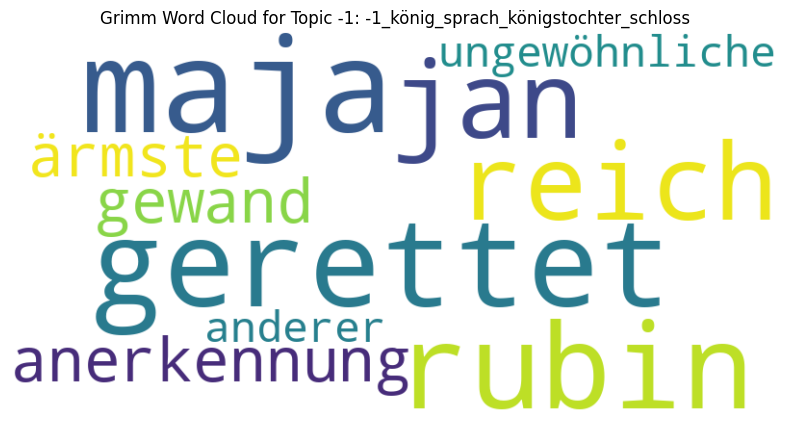

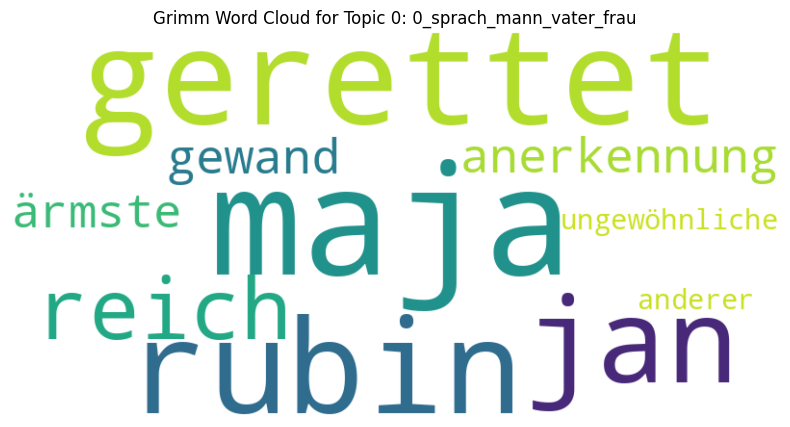

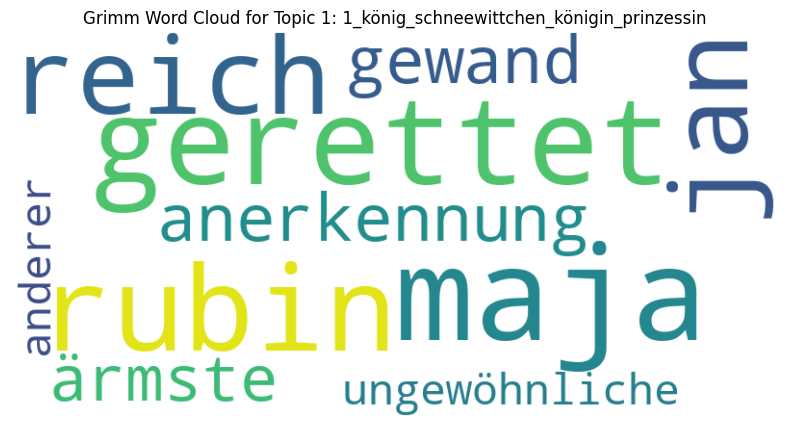

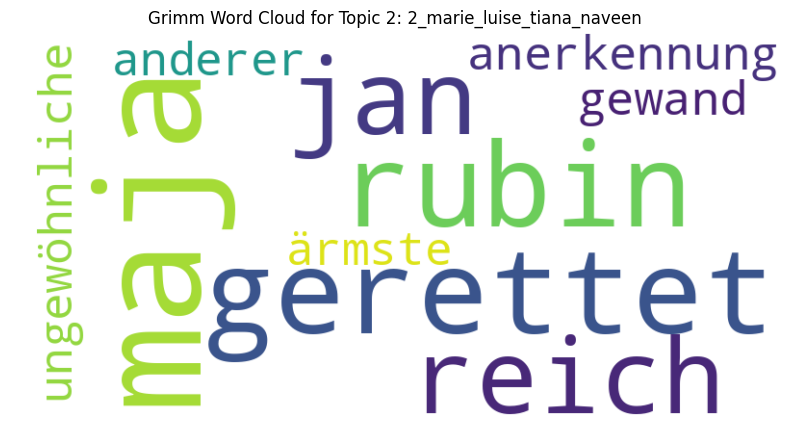

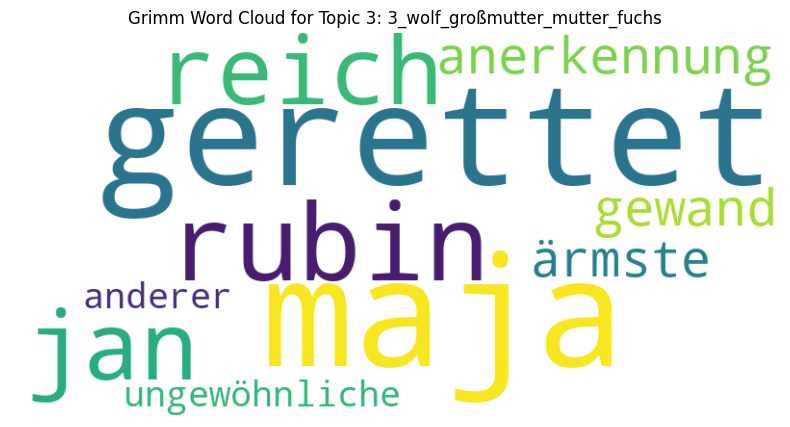

...

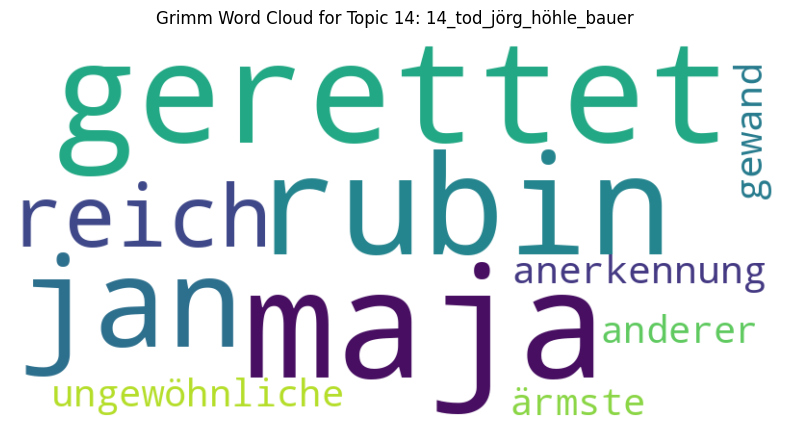

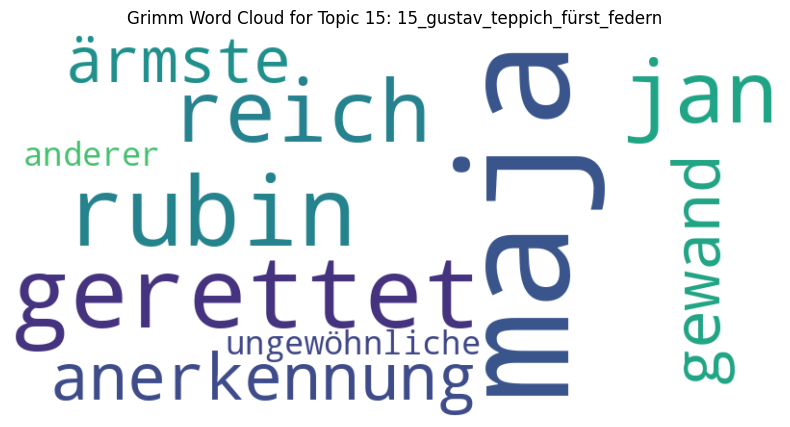

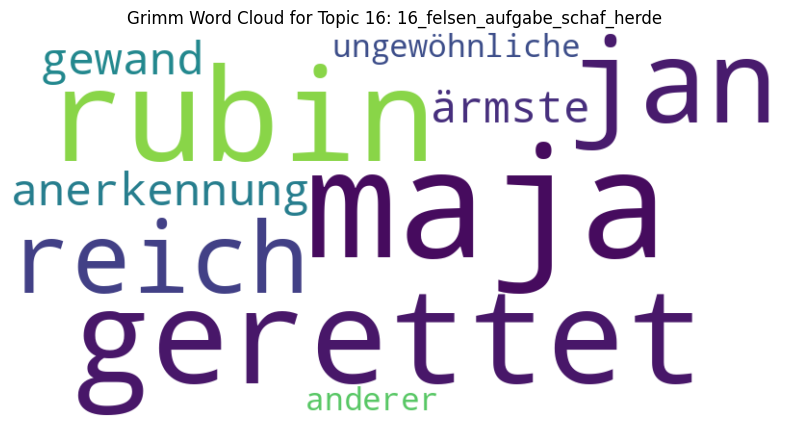

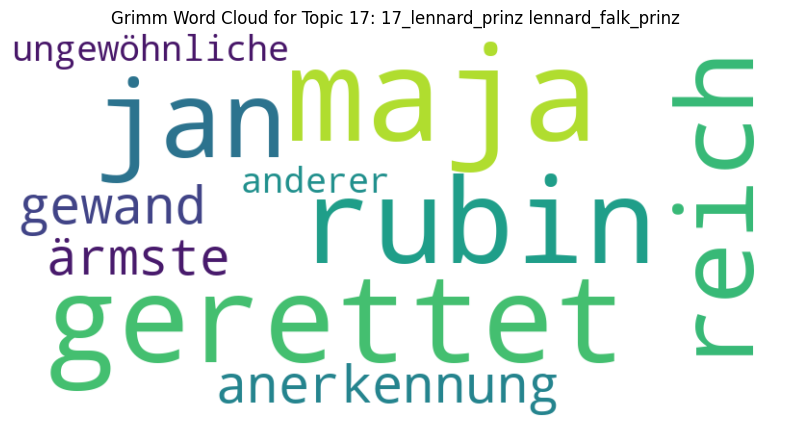

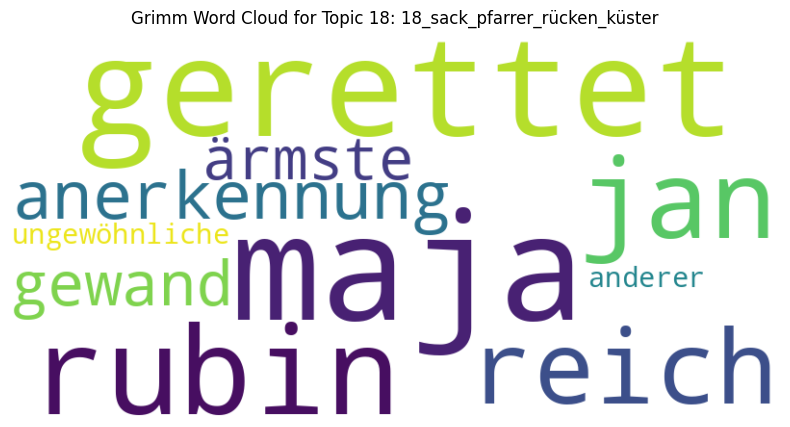

In [ ]:
# Get all topic information
all_topics_info_grimm = topic_model_grimm.get_topic_info()

# Filter out topic -1 (outliers) if you don't want a word cloud for it
# You can modify this loop to exclude any specific topics or include only a subset
for index, row in all_topics_info_grimm.iterrows():
    topic_id = row['Topic']
    topic_name = row['Name']

    # Get the words and their probabilities for the current topic
    topic_words_scores_grimm = topic_model_grimm.get_topic(topic_id)

    # Extract words and scores
    word_scores_grimm = {word: score for word, score in topic_words_scores_grimm}

    # Create the WordCloud object
    wordcloud_grimm = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_scores_andersen)

    # Display the generated image:
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_grimm, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Grimm Word Cloud for Topic {topic_id}: {topic_name}')
    plt.show()

In [ ]:
# Create results dataframe
# To fix the ValueError, we reconstruct the metadata lists (author, type, year)
# by repeating the values for each chunk generated from the original stories.

authors, types, years = [], [], []

for _, row in df_grimm.iterrows():
    # Re-calculate how many chunks this specific row produced
    # using the same logic from your 'split_into_chunks' step
    cleaned = clean_text(row["Text"])
    chunks_count = len(split_into_chunks(cleaned, chunk_size=200))

    # Repeat the metadata values for each of those chunks
    authors.extend([row["Author"]] * chunks_count)
    types.extend([row["Type"]] * chunks_count)
    years.extend([row["Year"]] * chunks_count)

# Now all lists have the same length and can be combined into a DataFrame
df_topic_modeling_grimm = pd.DataFrame({
    "text": documents,
    "topic": topics,
    "source": sources,
    "author": authors,
    "type": types,
    "year": years
})

df_topic_modeling_grimm.head()

,text,topic,source,author,type,year
0,"die drei federn fürst gundolf, des regierens m...",15,Die drei Federn,Grimm,Wikipedia,2014
1,um sich dort mit bier zu vergnügen. sie sind f...,15,Die drei Federn,Grimm,Wikipedia,2014
2,"am fluss ein blondes, barfüßiges junges mädche...",-1,Die drei Federn,Grimm,Wikipedia,2014
3,sein herz beinahe vor glück stehen bleibt. doc...,15,Die drei Federn,Grimm,Wikipedia,2014
4,die schönheit an gustavs seite stamme nicht au...,15,Die drei Federn,Grimm,Wikipedia,2014


In [ ]:
df_topic_modeling_grimm.to_csv('df_topic_modelin_grimm', index=False)
print("Topic information saved to df_topic_modeling_grimm")

Topic information saved to df_topic_modeling_grimm


### compare classic vs wikipedia vs copilot

Topic Distribution by Group (Normalized proportions):


topic,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
comparison_group,,,,,,,,,,,,,,,,,,,,
classic,0.355245,0.604196,0.000000,0.012587,0.013986,0.006993,0.000000,0.006993,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
wikipedia,0.216704,0.501129,0.072235,0.033860,0.031603,0.027088,0.024831,0.009029,0.011287,0.009029,0.006772,0.006772,0.004515,0.004515,0.004515,0.009029,0.009029,0.006772,0.004515,0.006772
copilot,0.210269,0.506112,0.058680,0.056235,0.046455,0.022005,0.012225,0.014670,0.009780,0.007335,0.009780,0.007335,0.007335,0.007335,0.007335,0.002445,0.002445,0.004890,0.004890,0.002445


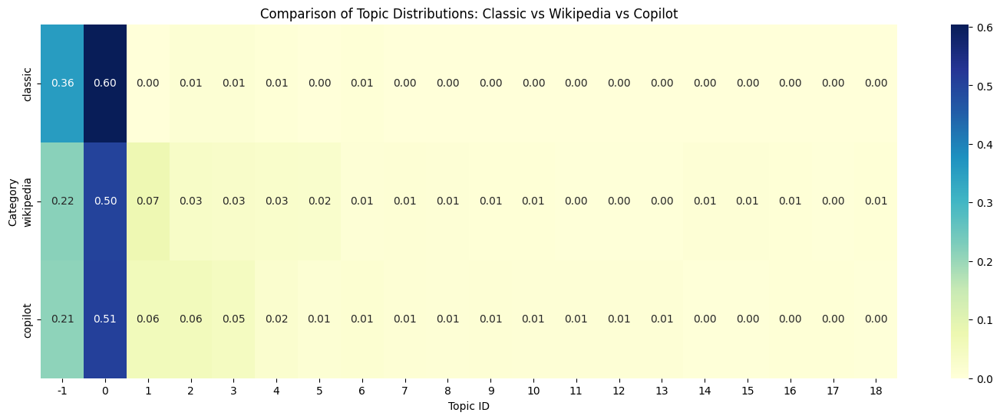

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Map the 'type' column to the specific groups requested
# 'Original' becomes 'classic', others stay as is (lowercased)
def map_groups(tale_type):
    t = str(tale_type).lower()
    if t == 'original':
        return 'classic'
    return t

df_topic_modeling['comparison_group'] = df_topic_modeling['type'].apply(map_groups)

# 2. Create the cross-tabulation (Group vs Topic)
topic_counts = pd.crosstab(df_topic_modeling['comparison_group'], df_topic_modeling['topic'])

# 3. Normalize the distribution to get percentages within each group
topic_dist_norm = topic_counts.div(topic_counts.sum(axis=1), axis=0)

# 4. Filter for only the three groups of interest
groups_to_show = ['classic', 'wikipedia', 'copilot']
# Ensure we only include groups that exist in the dataframe
available_groups = [g for g in groups_to_show if g in topic_dist_norm.index]
topic_dist_final = topic_dist_norm.loc[available_groups]

# 5. Display the numerical results
print("Topic Distribution by Group (Normalized proportions):")
display(topic_dist_final)

# 6. Visualize the comparison with a heatmap
plt.figure(figsize=(18, 6))
sns.heatmap(topic_dist_final, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Comparison of Topic Distributions: Classic vs Wikipedia vs Copilot")
plt.ylabel("Category")
plt.xlabel("Topic ID")
plt.show()

In [ ]:
topic_dist_final.to_csv("topic_dist_final.csv", index=True)

### compare Andersen classic vs wikipedia vs copilot

Andersen Topic Distribution by Group (Normalized proportions):


topic,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
comparison_group,,,,,,,,,,,,,,,,,,,,
Original,0.301538,0.489231,0.033846,0.040000,0.040000,0.024615,0.027692,0.000000,0.000000,0.000000,0.000000,0.000000,0.018462,0.000000,0.000000,0.000000,0.000000,0.012308,0.012308,0.000000
Wikipedia,0.193798,0.186047,0.263566,0.031008,0.023256,0.031008,0.023256,0.038760,0.062016,0.038760,0.031008,0.015504,0.000000,0.015504,0.015504,0.015504,0.015504,0.000000,0.000000,0.000000
Copilot,0.205479,0.253425,0.143836,0.041096,0.027397,0.041096,0.020548,0.061644,0.027397,0.027397,0.020548,0.034247,0.000000,0.020548,0.020548,0.020548,0.013699,0.000000,0.000000,0.020548


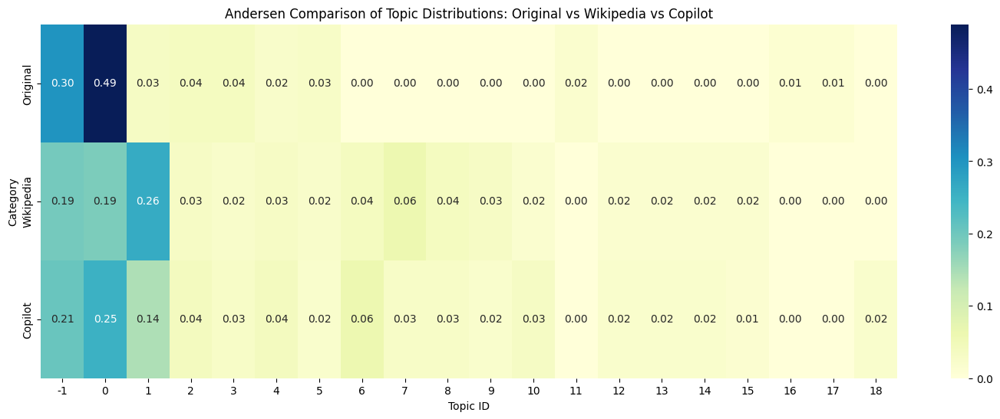

In [ ]:
# 1. Standardize the 'type' column to match requested labels exactly
def standardize_andersen_types(tale_type):
    t = str(tale_type).capitalize()
    if t == 'Original': return 'Original'
    if t == 'Wikipedia': return 'Wikipedia'
    if t == 'Copilot': return 'Copilot'
    return t

df_topic_modeling_andersen['comparison_group'] = df_topic_modeling_andersen['type'].apply(standardize_andersen_types)

# 2. Create the cross-tabulation (Group vs Topic)
topic_counts_andersen = pd.crosstab(df_topic_modeling_andersen['comparison_group'], df_topic_modeling_andersen['topic'])

# 3. Normalize the distribution to get percentages within each group
topic_dist_norm_andersen = topic_counts_andersen.div(topic_counts_andersen.sum(axis=1), axis=0)

# 4. Filter for the three groups of interest
groups_to_show_andersen = ['Original', 'Wikipedia', 'Copilot']
available_groups_andersen = [g for g in groups_to_show_andersen if g in topic_dist_norm_andersen.index]
topic_dist_final_andersen = topic_dist_norm_andersen.loc[available_groups_andersen]

# 5. Display the numerical results
print("Andersen Topic Distribution by Group (Normalized proportions):")
display(topic_dist_final_andersen)

# 6. Visualize the comparison with a heatmap
plt.figure(figsize=(18, 6))
sns.heatmap(topic_dist_final_andersen, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Andersen Comparison of Topic Distributions: Original vs Wikipedia vs Copilot")
plt.ylabel("Category")
plt.xlabel("Topic ID")
plt.show()

In [ ]:
topic_dist_final_andersen.to_csv("topic_dist_final_andersen.csv", index=True)

### compare Grimm classic vs wikipedia vs copilot

Grimm Topic Distribution by Group (Normalized proportions):


topic,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
comparison_group,,,,,,,,,,,,,,,,,,,,
Original,0.361538,0.369231,0.141026,0.000000,0.023077,0.012821,0.023077,0.002564,0.017949,0.005128,0.000000,0.005128,0.025641,0.000000,0.002564,0.000000,0.000000,0.000000,0.000000,0.010256
Wikipedia,0.133758,0.191083,0.226115,0.082803,0.041401,0.047771,0.035032,0.038217,0.022293,0.035032,0.035032,0.028662,0.003185,0.015924,0.019108,0.012739,0.012739,0.009554,0.009554,0.000000
Copilot,0.205323,0.174905,0.212928,0.057034,0.045627,0.045627,0.038023,0.049430,0.034221,0.030418,0.022814,0.019011,0.011407,0.019011,0.011407,0.007605,0.003802,0.007605,0.003802,0.000000


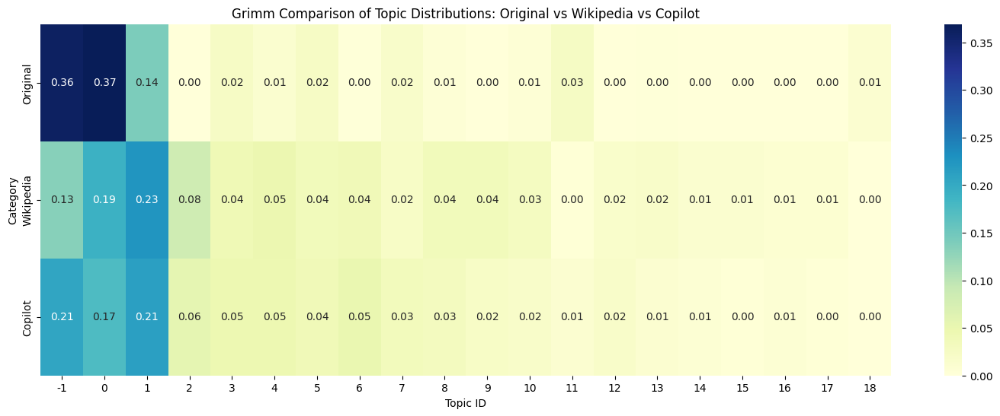

In [ ]:
# 1. Standardize the 'type' column to match requested labels exactly
def standardize_grimm_types(tale_type):
    t = str(tale_type).capitalize()
    if t == 'Original': return 'Original'
    if t == 'Wikipedia': return 'Wikipedia'
    if t == 'Copilot': return 'Copilot'
    return t

df_topic_modeling_grimm['comparison_group'] = df_topic_modeling_grimm['type'].apply(standardize_grimm_types)

# 2. Create the cross-tabulation (Group vs Topic)
topic_counts_grimm = pd.crosstab(df_topic_modeling_grimm['comparison_group'], df_topic_modeling_grimm['topic'])

# 3. Normalize the distribution to get percentages within each group
topic_dist_norm_grimm = topic_counts_grimm.div(topic_counts_grimm.sum(axis=1), axis=0)

# 4. Filter for the three groups of interest
groups_to_show_grimm = ['Original', 'Wikipedia', 'Copilot']
available_groups_grimm = [g for g in groups_to_show_grimm if g in topic_dist_norm_grimm.index]
topic_dist_final_grimm = topic_dist_norm_grimm.loc[available_groups_grimm]

# 5. Display the numerical results
print("Grimm Topic Distribution by Group (Normalized proportions):")
display(topic_dist_final_grimm)

# 6. Visualize the comparison with a heatmap
plt.figure(figsize=(18, 6))
sns.heatmap(topic_dist_final_grimm, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Grimm Comparison of Topic Distributions: Original vs Wikipedia vs Copilot")
plt.ylabel("Category")
plt.xlabel("Topic ID")
plt.show()

In [ ]:
topic_dist_final_grimm.to_csv("topic_dist_final_grimm.csv", index=True)

In [ ]:
# Normalized topic distribution by source
topic_distribution_by_source_group = topic_dist_norm.T.sort_values(by="classic", ascending=False)
#topic_distribution_norm.T.sort_values(by="Modern", ascending=False)
topic_distribution_by_source_group



comparison_group,classic,copilot,wikipedia
topic,,,
0,0.604196,0.506112,0.501129
-1,0.355245,0.210269,0.216704
3,0.013986,0.046455,0.031603
2,0.012587,0.056235,0.033860
6,0.006993,0.014670,0.009029
4,0.006993,0.022005,0.027088
1,0.000000,0.058680,0.072235
5,0.000000,0.012225,0.024831
7,0.000000,0.009780,0.011287


In [ ]:
topic_distribution_by_source_group.to_csv("topic_distribution_by_source_group.csv", index=True)
print("Topic distribution by period saved to topic_distribution_by_source_group.csv")

Topic distribution by period saved to topic_distribution_by_source_group.csv


##Document topic distribution heat map
similar to: [DARIAH-DE/Topics](https://github.com/DARIAH-DE/Topics)

DARIAH unfortunely doenst work

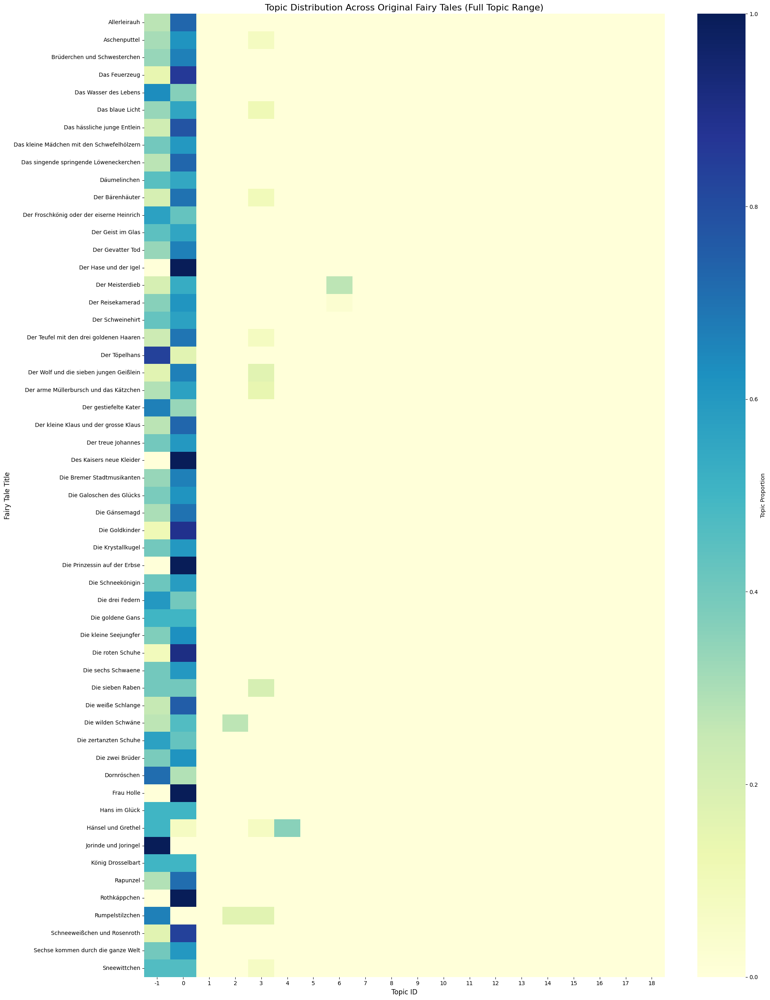

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Filter for only the original (classic) fairy tales
df_original = df_topic_modeling[df_topic_modeling['comparison_group'] == 'classic']

# 2. Create the cross-tabulation (Source/Title vs Topic)
tale_topic_counts = pd.crosstab(df_original['source'], df_original['topic'])

# 3. Normalize the distribution
tale_topic_dist = tale_topic_counts.div(tale_topic_counts.sum(axis=1), axis=0)

# 4. Force the table to include all topics from the main model (e.g., -1 to 18)
# This ensures the heatmap shows the full width even if some topics are 0 for original tales
all_possible_topics = sorted(df_topic_modeling['topic'].unique())
tale_topic_dist = tale_topic_dist.reindex(columns=all_possible_topics, fill_value=0)

# 5. Create the heatmap
plt.figure(figsize=(20, 25))
sns.heatmap(tale_topic_dist, annot=False, cmap="YlGnBu", cbar_kws={'label': 'Topic Proportion'})

plt.title("Topic Distribution Across Original Fairy Tales (Full Topic Range)", fontsize=16)
plt.ylabel("Fairy Tale Title", fontsize=12)
plt.xlabel("Topic ID", fontsize=12)
plt.tight_layout()
plt.show()

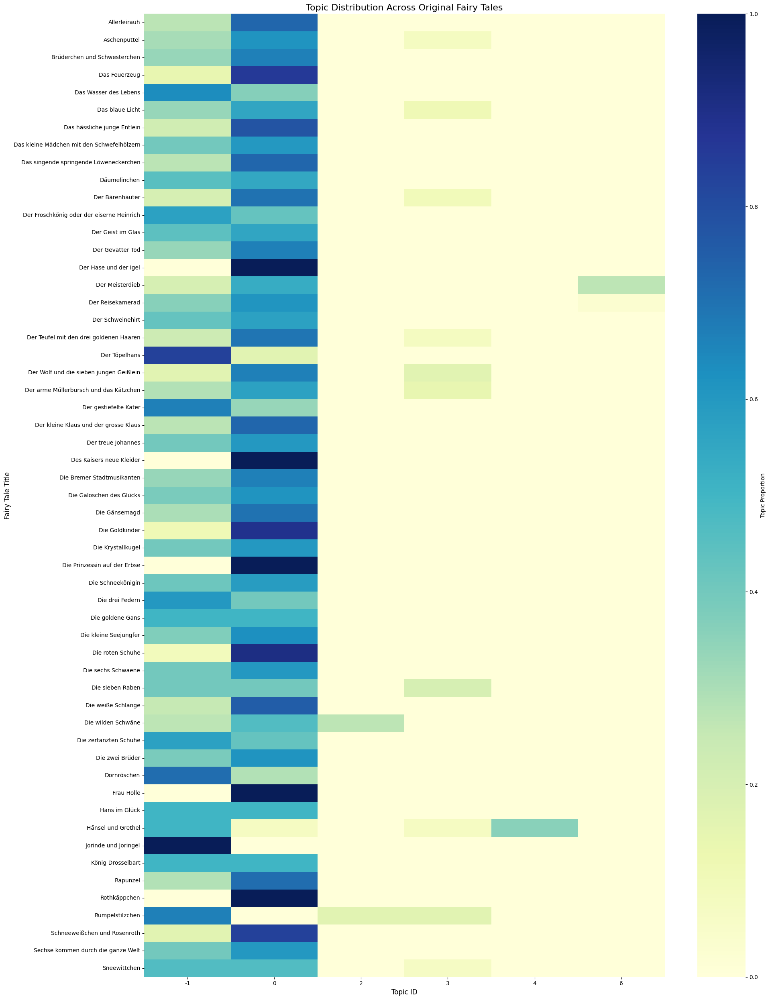

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Filter for only the original (classic) fairy tales
df_original = df_topic_modeling[df_topic_modeling['comparison_group'] == 'classic']

# 2. Create the cross-tabulation (Source/Title vs Topic)
tale_topic_counts = pd.crosstab(df_original['source'], df_original['topic'])

# 3. Normalize the distribution to show relative importance of topics per story
tale_topic_dist = tale_topic_counts.div(tale_topic_counts.sum(axis=1), axis=0)

# 4. Create the heatmap
plt.figure(figsize=(20, 25))
sns.heatmap(tale_topic_dist, annot=False, cmap="YlGnBu", cbar_kws={'label': 'Topic Proportion'})

plt.title("Topic Distribution Across Original Fairy Tales", fontsize=16)
plt.ylabel("Fairy Tale Title", fontsize=12)
plt.xlabel("Topic ID", fontsize=12)
plt.tight_layout()
plt.show()

### Trio comparisons
Standardize the story types in the dataset (e.g., to 'Original', 'Wikipedia', 'Copilot'), identify fairy tales that have versions for all three types (forming a "Trio"), and generate a normalized topic distribution heatmap for each identified tale Trio using the data in `df_topic_modeling`.

Identified 36 Trios: ['Allerleirauh', 'Aschenputtel', 'Brüderchen und Schwesterchen', 'Das Feuerzeug', 'Das Wasser des Lebens', 'Das blaue Licht', 'Däumelinchen', 'Der Bärenhäuter', 'Der Geist im Glas', 'Der Hase und der Igel', 'Der Meisterdieb', 'Der Reisekamerad', 'Der Schweinehirt', 'Der Teufel mit den drei goldenen Haaren', 'Der arme Müllerbursch und das Kätzchen', 'Der gestiefelte Kater', 'Der treue Johannes', 'Des Kaisers neue Kleider', 'Die Bremer Stadtmusikanten', 'Die Galoschen des Glücks', 'Die Gänsemagd', 'Die Prinzessin auf der Erbse', 'Die Schneekönigin', 'Die drei Federn', 'Die goldene Gans', 'Die roten Schuhe', 'Die sieben Raben', 'Die weiße Schlange', 'Die wilden Schwäne', 'Die zertanzten Schuhe', 'Dornröschen', 'Frau Holle', 'Hans im Glück', 'Jorinde und Joringel', 'König Drosselbart', 'Sechse kommen durch die ganze Welt']


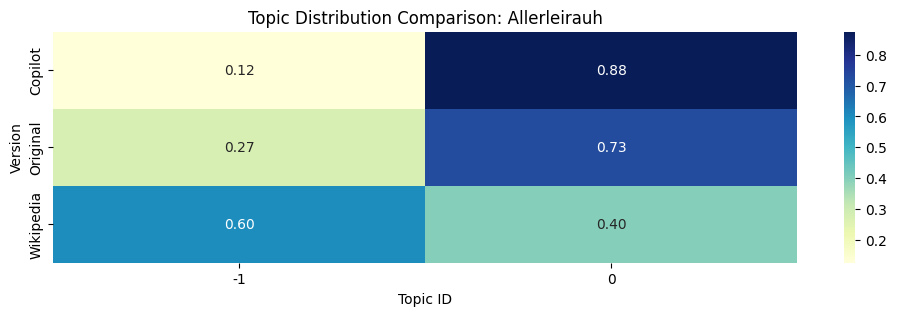

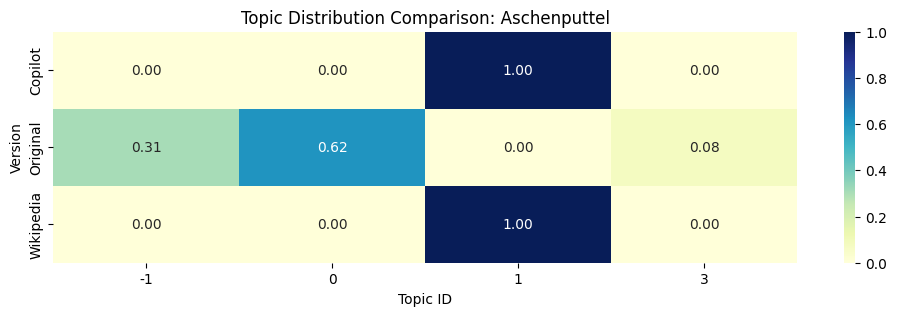

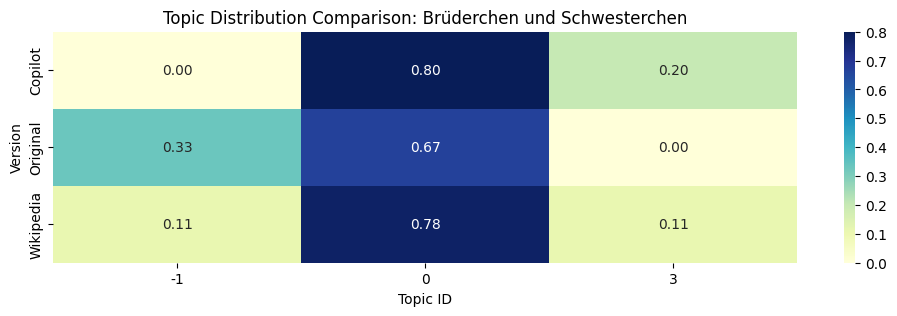

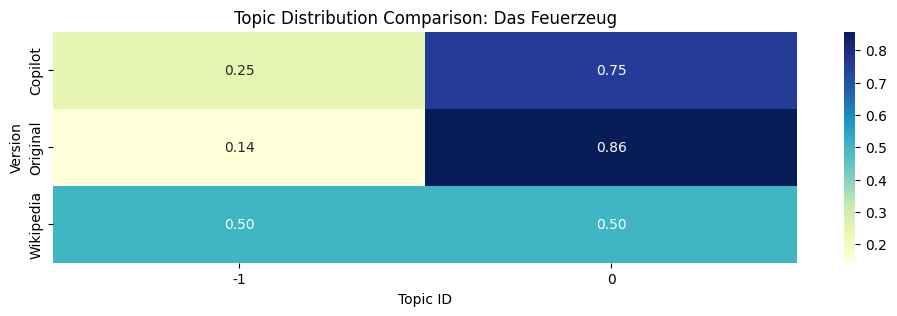

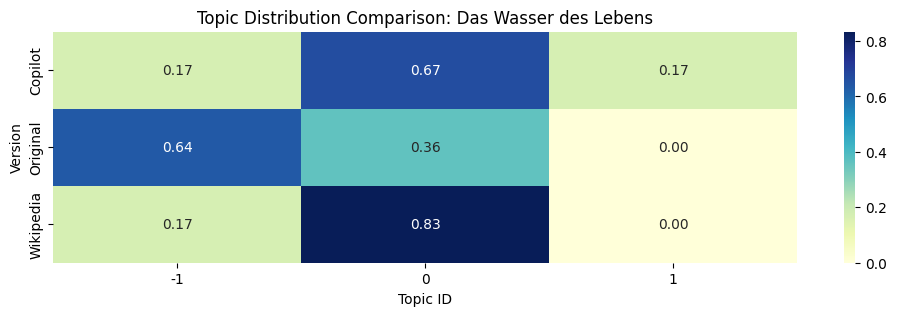

...

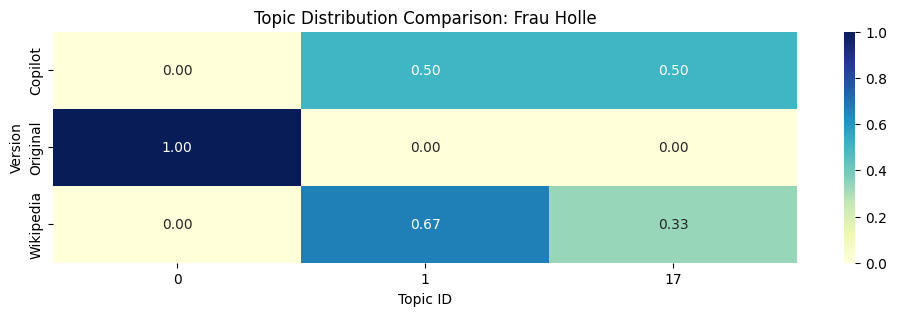

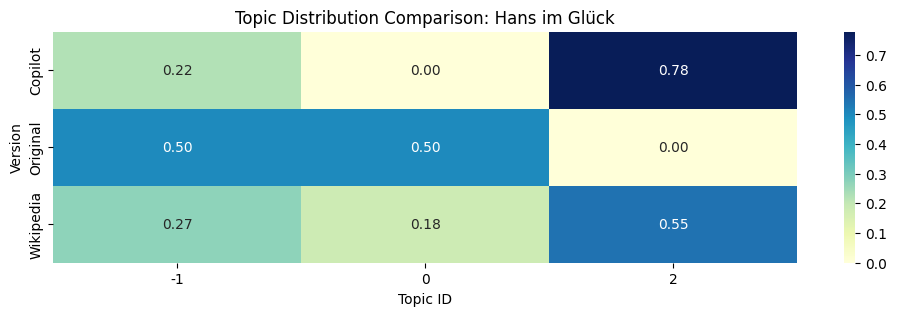

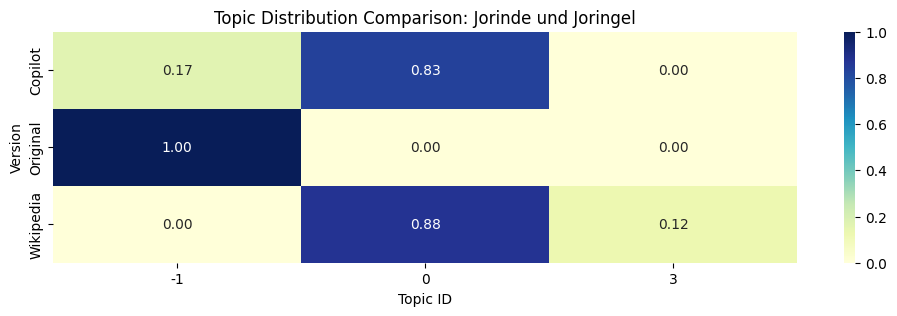

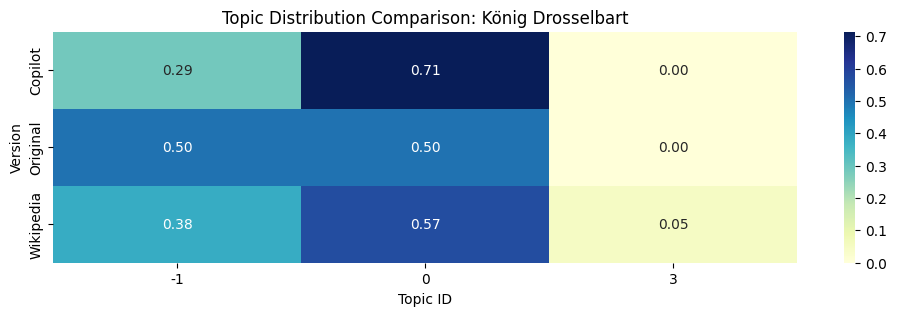

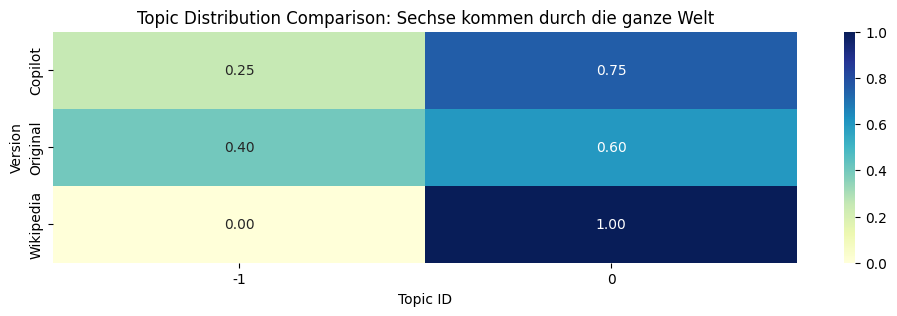

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Standardize story types
def standardize_type(t):
    t = str(t).lower()
    if 'original' in t: return 'Original'
    if 'wikipedia' in t: return 'Wikipedia'
    if 'copilot' in t: return 'Copilot'
    return 'Other'

df_topic_modeling['std_type'] = df_topic_modeling['type'].apply(standardize_type)

# 2. Identify Trios (stories with all 3 versions)
story_counts = df_topic_modeling.groupby('source')['std_type'].nunique()
trios = story_counts[story_counts >= 3].index.tolist()

print(f'Identified {len(trios)} Trios: {trios}')

# 3. Generate a heatmap for each Trio
for story in trios:
    trio_data = df_topic_modeling[df_topic_modeling['source'] == story]
    trio_data = trio_data[trio_data['std_type'].isin(['Original', 'Wikipedia', 'Copilot'])]

    # Cross-tabulate and normalize
    ct = pd.crosstab(trio_data['std_type'], trio_data['topic'])
    ct_norm = ct.div(ct.sum(axis=1), axis=0)

    # Plot
    plt.figure(figsize=(12, 3))
    sns.heatmap(ct_norm, annot=True, cmap='YlGnBu', fmt='.2f')
    plt.title(f'Topic Distribution Comparison: {story}')
    plt.ylabel('Version')
    plt.xlabel('Topic ID')
    plt.show()